In [4]:
## Explainability
#!pip install -r requirements.txt --user
#!pip install numpy
import pandas as pd
import numpy as np
import matplotlib
from helpful_util import Perturb, load_models_uci, display_sklearn_feature_importance
import warnings
warnings.filterwarnings('ignore')
import keras
import lime
import lime.lime_tabular
%matplotlib inline

In [5]:
#Loading COO Matrices - sparse with OHE of all original Features

def save_obj(obj, name):
    import pickle
    with open('obj/census/' + name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)


def load_obj(name):
    import pickle
    with open('obj/census/' + name + '.pkl', 'rb') as f:
        return pickle.load(f)
    


#Keras and Sklearn have different ways of showing prediction probabilities. Keras == model.predict, sklearn == model.predict_proba
def explain_lime(model, train, test, observation, seed = 1, num_features = 10):
    '''
    Parameters:
        model: object,
            Random Forest: rfc
            Gradient Boosted Classifier: gbc
            Logistic Regression: logit
            Keras Neural Network = keras_ann
            Sklearn Neural Network = sk_ann
        train: object; train set dataframe
        test: object; test set dataframe
        observation: int (index of explanation on test data set)
        seed: int; default to 1
        num_features: int, the number of features to be displayed in explanation
        
    Returns:
        Local explanations over test set - Summary
    '''
    np.random.seed(seed)
    i = observation
    
    if type(model) == keras.engine.sequential.Sequential:
        predict_fn = lambda x: model.predict(encoder.transform(x).toarray())
    else:
        predict_fn = lambda x: model.predict_proba(encoder.transform(x)).astype(float)

    explainer = lime.lime_tabular.LimeTabularExplainer(
        train,
        feature_names=feature_names,
        class_names=class_names,
        categorical_features=categorical_features,
        categorical_names=categorical_names,
        kernel_width=3)

    
    exp = explainer.explain_instance(test[i], predict_fn, num_features= num_features)
    exp.show_in_notebook(show_all=True)

    print('-' * 125)    
    print("Looking at Observation: {}".format(i))
    print("Actual Class Label: {}".format(y_test[i]))   
    %matplotlib inline
    try: #If Keras
        print("Predicted Class Label: {}".format(np.argmax(model.predict(encoder.transform(test).toarray()),axis = 1)[i]))
        print("Prediction Confidence (Prob): {0:.2f}%".format(np.max(model.predict(encoder.transform(test).toarray())[i]*100)))
        print('-' * 125)
        print("Displaying Local Explanation for Prediction......")
    except: #If Sklearn
        print('-' * 125)
        print("Predicted Class Label: {}".format(np.argmax(model.predict_proba(encoder.transform(test[i].reshape(1,-1))).astype(float))
        ))
        print("Prediction Confidence (Prob): {0:.2f}%".format(np.max(model.predict_proba(encoder.transform(test[i].reshape(1,-1)))[0])*100))
        print('-' * 125)
        print("Displaying Local Explanation for Prediction: Top {} Features......".format(num_features))
    fig = exp.as_pyplot_figure()

## Load Data Objects. Stored these locally/remotely to avoid dependency issues

In [6]:
feature_names = [
    "Age", "Workclass", "fnlwgt", "Education", "Education-Num",
    "Marital Status", "Occupation", "Relationship", "Race", "Sex",
    "Capital Gain", "Capital Loss", "Hours per week", "Country"
]

categorical_features = [1, 3, 5, 6, 7, 8, 9,
                        13]  #Get Nominal / Ordinal / etc..

X_train = load_obj('data_objects/X_train')
X_test = load_obj('data_objects/X_test')
y_train = load_obj('data_objects/y_train')
y_test = load_obj('data_objects/y_test')

encoded_train = load_obj('data_objects/encoded_train')
encoded_test = load_obj('data_objects/encoded_test')
categorical_names = load_obj('data_objects/categorical_names')
data = load_obj('data_objects/data')
encoder = load_obj('data_objects/encoder')

#SciKit Learn Feature Importance in Linear Coefficient Rankinks

#all features as a list. Unwrapping encoding
features = []
for k in categorical_names.values():
    for i in k:
        features.append(i)

continuous = [
    'age', 'fnlwgt', 'Education-Num', 'capital_gain', 'capital_loss',
    'hrs_per_week'
]

features = features + continuous

rfc, gbc, logit, keras_ann, sk_ann = load_models_uci()
class_names = ['<50k', '>50k']

#Split
#Manual perturbations
%matplotlib inline
X_test_holdout = load_obj('data_objects/X_test')
idx = np.random.choice(X_test_holdout.shape[0], 2000,
                       replace=False)  #Random 2000 samples w/o replacements
X_test_holdout = X_test_holdout[idx]  #extract
X_test_holdout = pd.DataFrame(
    encoder.transform(X_test_holdout).toarray(),
    columns=features)  #Convert to DF for column names
y_test_holdout = y_test[idx]

X_train_shap = pd.DataFrame(encoded_train.toarray(), columns=features)
X_test_shap = pd.DataFrame(encoder.transform(X_test).toarray(),
                           columns=features)
X_shap = pd.concat([X_train_shap, X_test_shap])

shap_values = load_obj('data_objects/shap_values')  #Load Dict of Shap Values

models = {
    str(type(rfc)): ('Random Forest', shap_values[str(type(rfc))]),
    str(type(gbc)):
    ('Gradient Boosted Classifier', shap_values[str(type(gbc))]),
    str(type(logit)): ('Logistic Regression', shap_values[str(type(logit))]),
    str(type(sk_ann)):
    ('Sklearn MultiLayer Perceptron', shap_values[str(type(sk_ann))]),
    str(type(keras_ann)):
    ('Keras Multilayer Perceptron', shap_values[str(type(keras_ann))])
}

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


## Some statistics on our models

In [8]:
#Some classification Reports and Confusion Matrices
import sklearn
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

get_best_score = lambda x, y: sklearn.metrics.accuracy_score(
    x, y.predict(encoded_test))

rf_best_score = get_best_score(y_test, rfc)
gbc_best_score = get_best_score(y_test, gbc)
lr_best_score = get_best_score(y_test, logit)
nn_best_score = get_best_score(y_test, sk_ann)
ker_nn_best_score = sklearn.metrics.accuracy_score(
    y_test, np.argmax(keras_ann.predict(encoded_test.toarray()), axis=1))

print("\033[1mPrinting Test Accuracy.... \033[0m")
print("Random Forest: {0:.2f} %".format(rf_best_score * 100))
print("Gradient Boosting: {0:.2f} %".format(gbc_best_score * 100))
print("Logistic Regression: {0:.2f} %".format(lr_best_score * 100))
print("SKLEARN Neural Net: {0:.2f} %".format(nn_best_score * 100))
print("Keras Neural Net: {0:.2f} % \n \n".format(ker_nn_best_score * 100))

 Random Forest Classification Report...
 
              precision    recall  f1-score   support

           0       0.99      0.95      0.97      1484
           1       0.96      0.99      0.98      1581

    accuracy                           0.98      3065
   macro avg       0.98      0.97      0.98      3065
weighted avg       0.98      0.98      0.98      3065



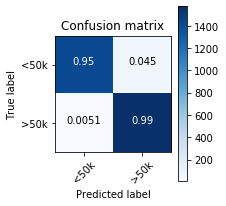

 Gradient Boosting Classification Report...
 
              precision    recall  f1-score   support

           0       0.91      0.85      0.88      1484
           1       0.87      0.92      0.89      1581

    accuracy                           0.89      3065
   macro avg       0.89      0.88      0.89      3065
weighted avg       0.89      0.89      0.89      3065



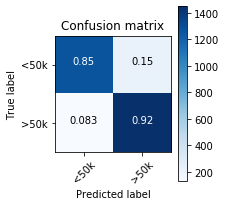

 Logistic Regression Classification Report...
 
              precision    recall  f1-score   support

           0       0.84      0.79      0.81      1484
           1       0.81      0.86      0.83      1581

    accuracy                           0.82      3065
   macro avg       0.83      0.82      0.82      3065
weighted avg       0.83      0.82      0.82      3065



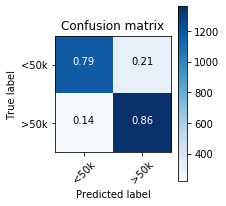

 SKLEARN Neural Network Classification Report...
 
              precision    recall  f1-score   support

           0       0.62      0.94      0.75      1484
           1       0.90      0.45      0.60      1581

    accuracy                           0.69      3065
   macro avg       0.76      0.70      0.67      3065
weighted avg       0.76      0.69      0.67      3065



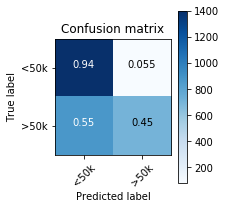

 KERAS Neural Network Classification Report...
 
              precision    recall  f1-score   support

           0       0.79      0.80      0.80      1484
           1       0.81      0.80      0.81      1581

    accuracy                           0.80      3065
   macro avg       0.80      0.80      0.80      3065
weighted avg       0.80      0.80      0.80      3065



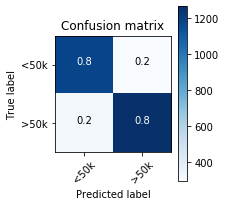

In [10]:
from pylab import rcParams
from helpful_util import plot_confusion_matrix
import matplotlib.pyplot as plt
rcParams['figure.figsize'] = 3, 3  #Adjust plot size

print_class_report = lambda x, y: print(classification_report(x, y))

print("\033[1m Random Forest Classification Report...\n \033[0m")
print_class_report(y_test, rfc.predict(encoded_test))
cm = confusion_matrix(y_test, rfc.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m Gradient Boosting Classification Report...\n \033[0m")
print_class_report(y_test, gbc.predict(encoded_test))
cm = confusion_matrix(y_test, gbc.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m Logistic Regression Classification Report...\n \033[0m")
print_class_report(y_test, logit.predict(encoded_test))
cm = confusion_matrix(y_test, logit.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m SKLEARN Neural Network Classification Report...\n \033[0m")
print_class_report(y_test, sk_ann.predict(encoded_test))
cm = confusion_matrix(y_test, sk_ann.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m KERAS Neural Network Classification Report...\n \033[0m")
print_class_report(
    y_test, np.argmax(keras_ann.predict(encoded_test.toarray()), axis=1))
cm = confusion_matrix(
    y_test, np.argmax(keras_ann.predict(encoded_test.toarray()), axis=1))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

## Graphs Showing Standard Feature Importance via Sklearn API


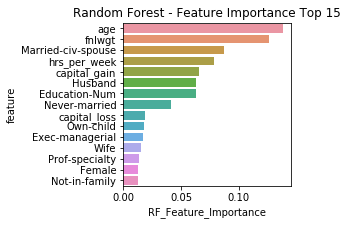

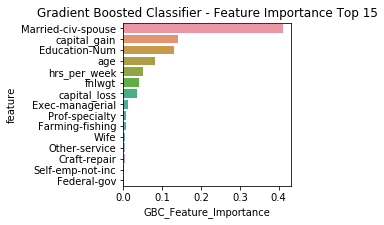

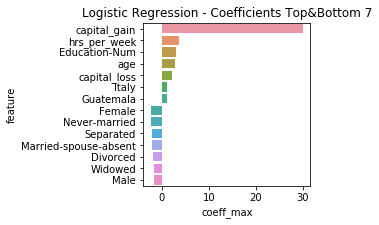

In [11]:
import seaborn as sns
display_sklearn_feature_importance(data=encoded_train,
                                   set='uci',
                                   features=features,
                                   n_features=15)

In [10]:
logistic_regress_coeff = pd.DataFrame({
    "features": features,
    "Coef": logit.coef_[0]
})
logistic_regress_coeff
logistic_regress_coeff.to_csv('obj/census/logit_coefficients.csv')

## Exploring with Manual Feature Perturbation

In [7]:
import collections
p = Perturb(X_test_holdout, y_test_holdout, data_str= 'uci')

p.manual_perturb(column='age',
               scalar=1.1)
p.manual_perturb(
               column='age',
               scalar=1.2)
p.manual_perturb(
               column='fnlwgt',
               scalar=1.1)
p.manual_perturb(
               column='fnlwgt',
               scalar=1.2)

Perturbing Feature: age by 1.1
Random Forest
Before Perturbation, Accuracy: 0.979
After Perturbation, Accuracy: 0.951
Number of '1' Predictions, Before Perturbation: 1075
Number of '1' Predictions, After Perturbation: 1095

Gradient Boosted Classifier
Before Perturbation, Accuracy: 0.895
After Perturbation, Accuracy: 0.896
Number of '1' Predictions, Before Perturbation: 1107
Number of '1' Predictions, After Perturbation: 1115

Logistic Regression
Before Perturbation, Accuracy: 0.8375
After Perturbation, Accuracy: 0.837
Number of '1' Predictions, Before Perturbation: 1110
Number of '1' Predictions, After Perturbation: 1149

Neural Net
Before Perturbation, Accuracy: 0.804
After Perturbation, Accuracy: 0.808
Number of '1' Predictions, Before Perturbation: 1035
Number of '1' Predictions, After Perturbation: 1097

Perturbing Feature: age by 1.2
Random Forest
Before Perturbation, Accuracy: 0.979
After Perturbation, Accuracy: 0.9295
Number of '1' Predictions, Before Perturbation: 1075
Number 

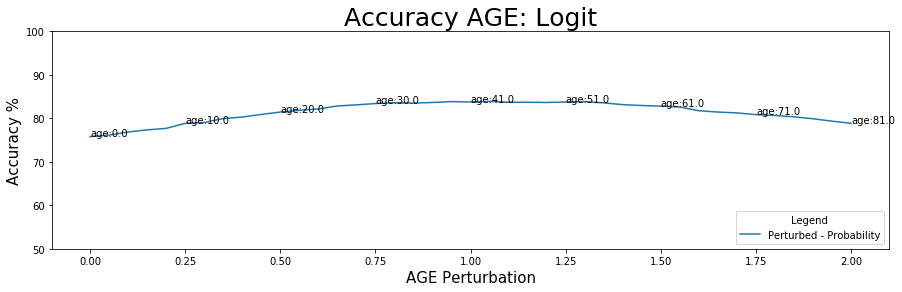

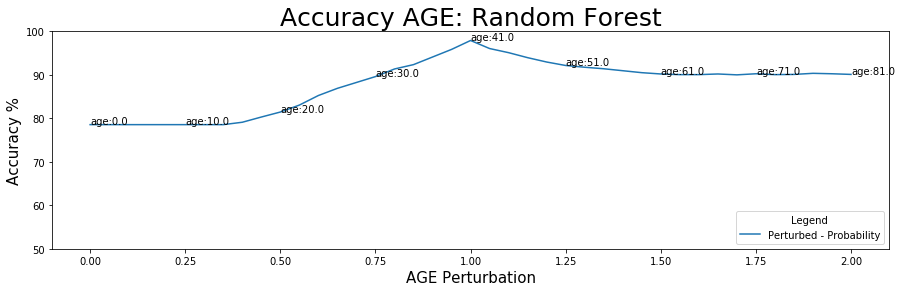

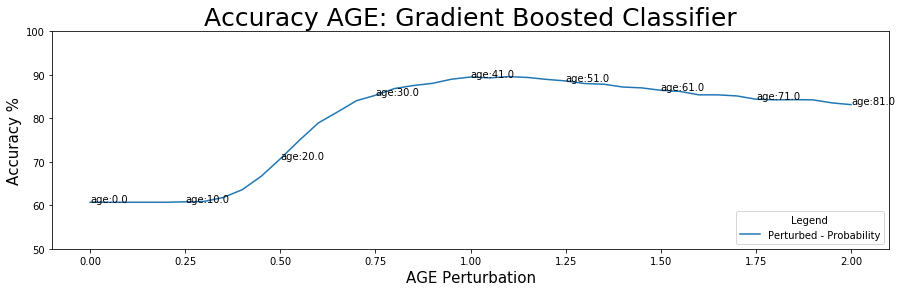

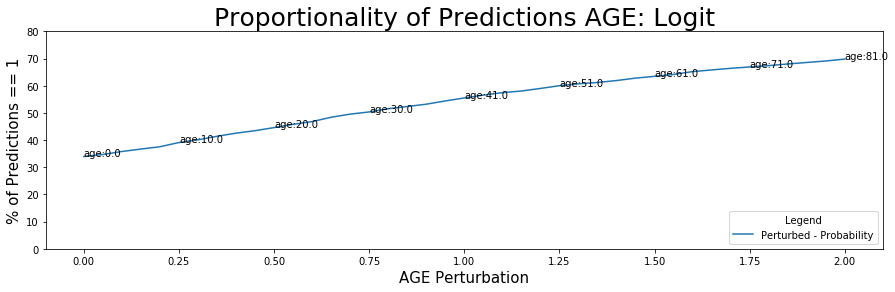

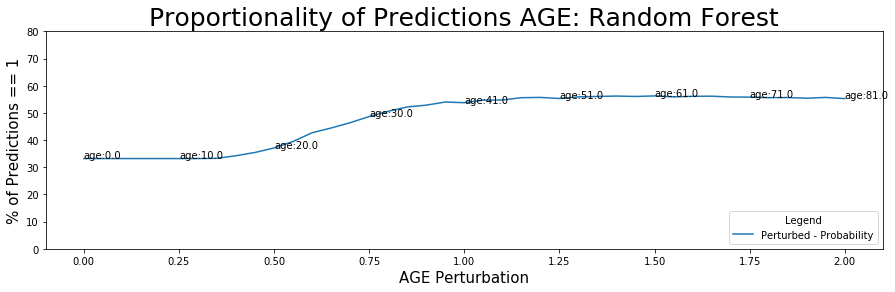

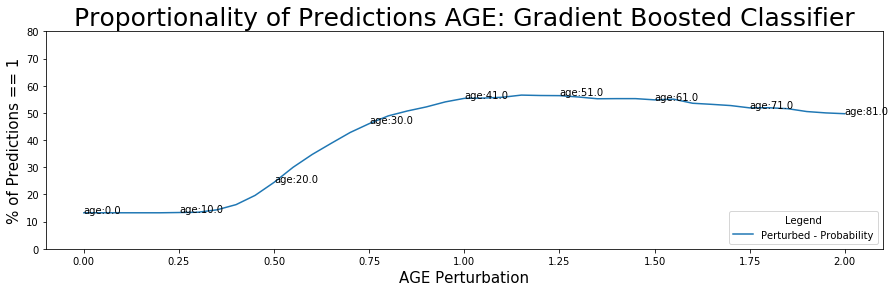

In [8]:
#Showing Samples
p.perturb_graph(model=logit, mode='accuracy', column='age', title='Logit')
p.perturb_graph(model=rfc,
                mode='accuracy',
                column='age',
                title='Random Forest')
p.perturb_graph(model=gbc,
                mode='accuracy',
                column='age',
                title='Gradient Boosted Classifier')

p.perturb_graph(model=logit, mode='proportion', column='age', title='Logit')
p.perturb_graph(model=rfc,
                mode='proportion',
                column='age',
                title='Random Forest')
p.perturb_graph(model=gbc,
                mode='proportion',
                column='age',
                title='Gradient Boosted Classifier')

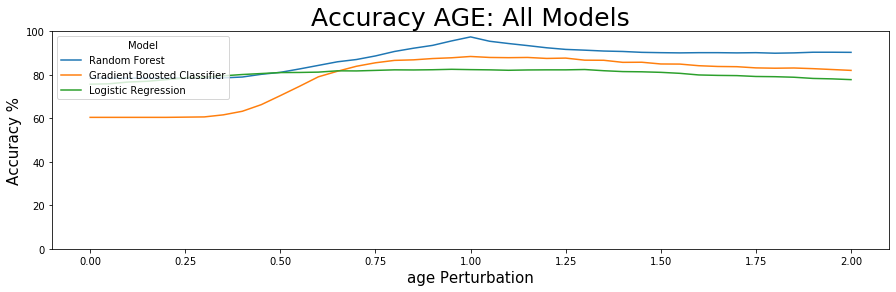

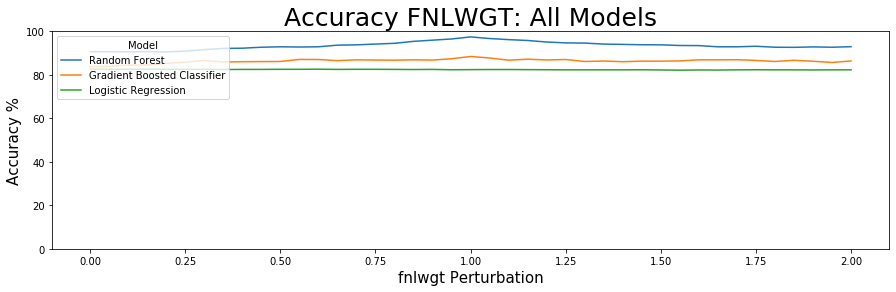

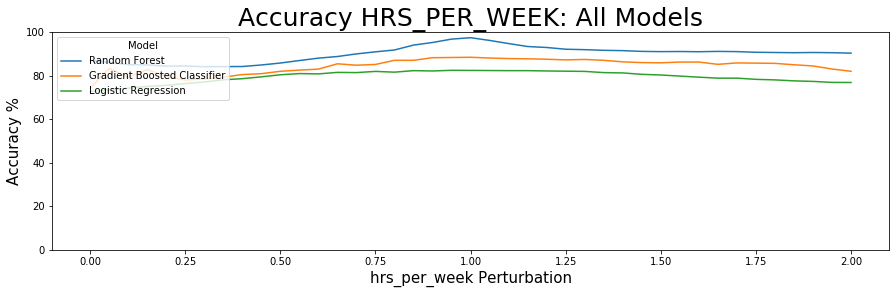

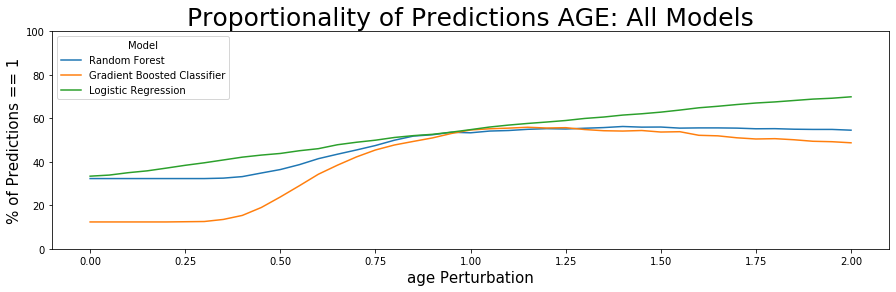

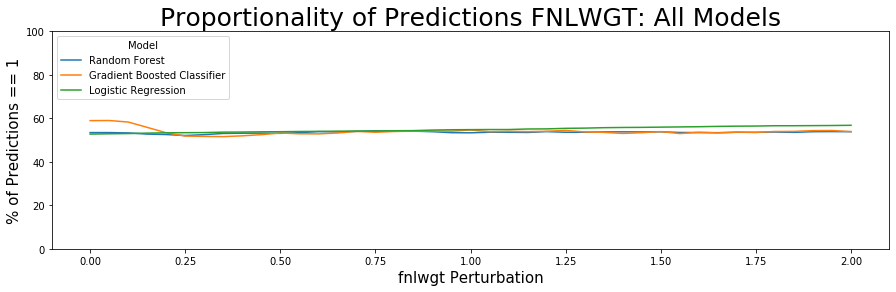

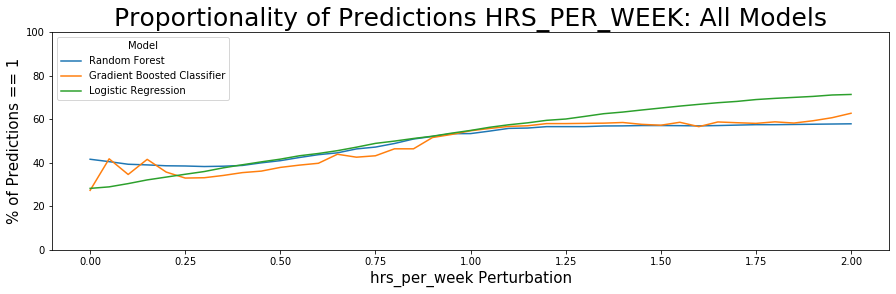

In [65]:
p.perturb_graph_cons(mode='accuracy', column='age', title='All Models')
p.perturb_graph_cons(mode='accuracy', column='fnlwgt', title='All Models')
p.perturb_graph_cons(mode='accuracy',
                     column='hrs_per_week',
                     title='All Models')

p.perturb_graph_cons(mode='proportion', column='age', title='All Models')
p.perturb_graph_cons(mode='proportion', column='fnlwgt', title='All Models')
p.perturb_graph_cons(mode='proportion',
                     column='hrs_per_week',
                     title='All Models')

## Lime (Local) Explanations

-----------------------------------------------------------------------------------------------------------------------------
Looking at Observation: 1
Actual Class Label: 1
Predicted Class Label: 1
Prediction Confidence (Prob): 79.99%
-----------------------------------------------------------------------------------------------------------------------------
Displaying Local Explanation for Prediction......


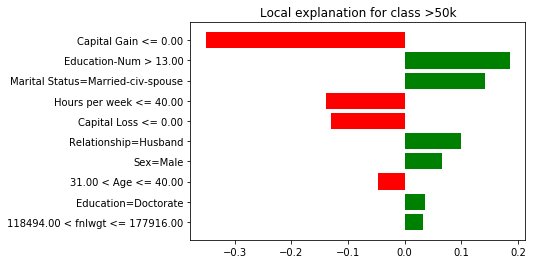

In [16]:
explain_lime(model = keras_ann, train = X_train, test = X_test, observation=1)

## Shap (Local & Global Explanations)

In [4]:
#Testing
from helpful_util import ExplainShap
import shap
shap.initjs()
plot = ExplainShap(X_train_shap, X_test_shap, models, features, class_names = ['<50k', '>50k'])
plot.shap_local_graph(model=keras_ann, observation=1)
#plot.shap_local_graph(model=logit,  observation=1)
#plot.shap_local_graph(model=rfc, observation=1)
#plot.shap_local_graph(model=gbc, observation=1)

Keras Multilayer Perceptron Shap Values


In [20]:
#Testing
plot.shap_many_graph(keras_ann)

In [ ]:
shap.dependence_plot("age", shap_values['keras_ann'], X_test_shap)

Keras Multilayer Perceptron Shap Values


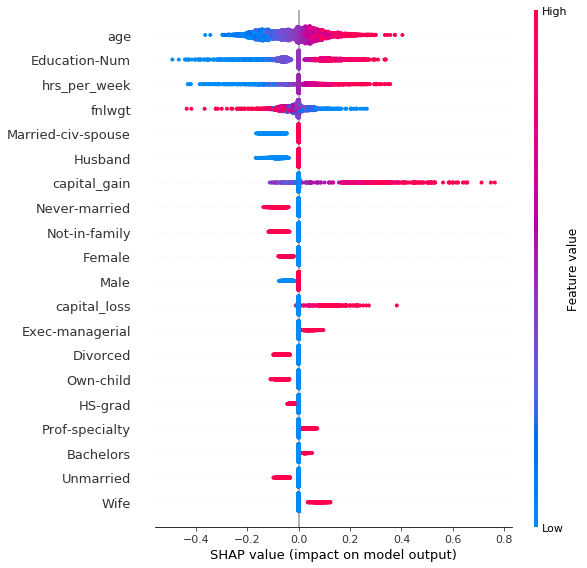

Logistic Regression Shap Values


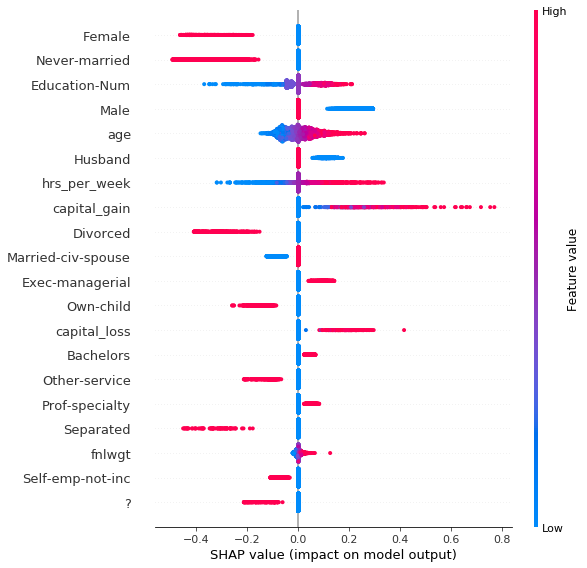

Random Forest Shap Values


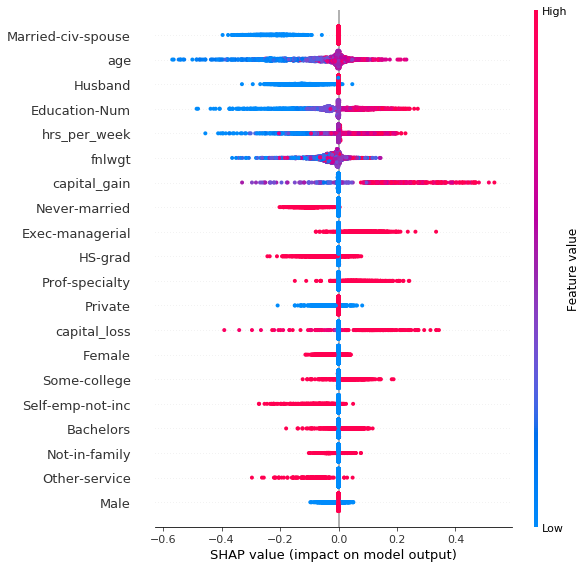

Gradient Boosted Classifier Shap Values


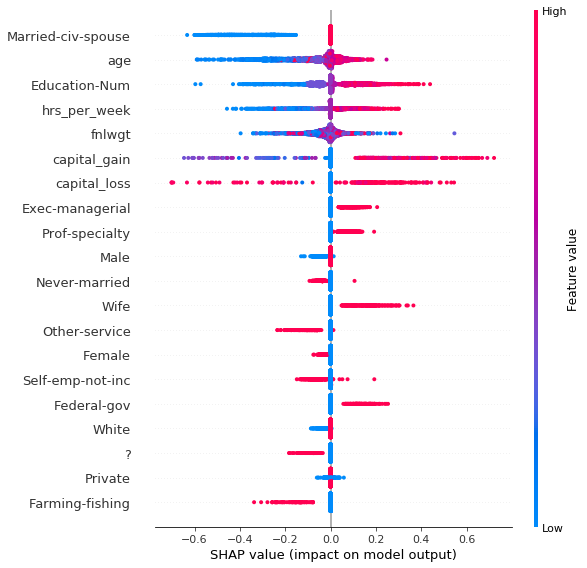

In [5]:
#Testing
plot.shap_summary_graph(keras_ann)
#shap_summary_graph(sk_ann, data = X_train_shap, model_str='sklearn_ann')
plot.shap_summary_graph(logit)
plot.shap_summary_graph(rfc)
plot.shap_summary_graph(gbc)

In [22]:

pd.DataFrame(shap_values[str(type(rfc))], columns = features).sum().to_csv('obj/lendingclub/shap/logit_shap.csv')
pd.DataFrame(shap_values[str(type(logit))], columns = features).sum().to_csv('obj/lendingclub/shap/rfc_shap.csv')
pd.DataFrame(shap_values[str(type(gbc))], columns = features).sum().to_csv('obj/lendingclub/shap/gbc_shap.csv')
pd.DataFrame(shap_values[str(type(keras_ann))], columns = features).sum().to_csv('obj/lendingclub/shap/ann_shap.csv')


pd.DataFrame(shap_values[str(type(rfc))], columns = features).abs().sum().to_csv('obj/lendingclub/shap/logit_shap_abs.csv')
pd.DataFrame(shap_values[str(type(logit))], columns = features).abs().sum().to_csv('obj/lendingclub/shap/rfc_shap_abs.csv')
pd.DataFrame(shap_values[str(type(gbc))], columns = features).abs().sum().to_csv('obj/lendingclub/shap/gbc_shap_abs.csv')
pd.DataFrame(shap_values[str(type(keras_ann))], columns = features).abs().sum().to_csv('obj/lendingclub/shap/ann_shap_abs.csv')





## Working with Integrated Gradients

In [16]:
#ig = integrated_gradients(keras_ann)
#from collections import OrderedDict

#from IntegratedGradients import IntegratedGradients

#ig = IntegratedGradients.integrated_gradients(keras_ann)

#def fetch_grads(test_data):
#    grads = []
#    for i in test_data.toarray():
#        grads.append(ig.explain(i, num_steps= 1000))
#    return pd.DataFrame(grads, columns = features)

    
#keras_ig_df = fetch_grads(encoded_test) 

#save_obj(keras_ig_df, 'keras_ig_df')


Evaluated output channel (0-based index): All
Building gradient functions
Progress: 100.0%
Done.


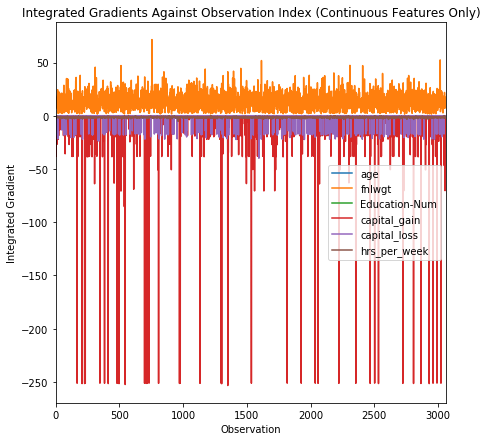

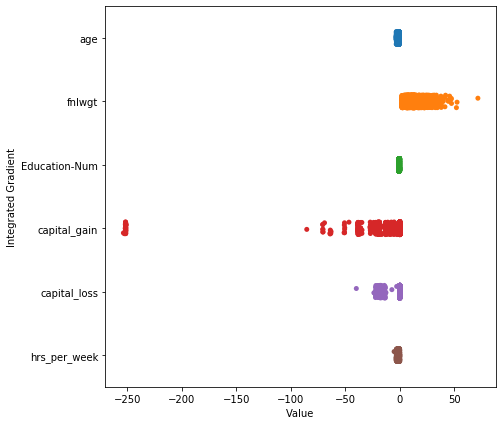

In [27]:
#Show integrated gradients of only continuous features
keras_ig_df = load_obj('data_objects/keras_ig_df')
keras_ig_df[continuous].plot()
rcParams['figure.figsize'] = 7,7  #Adjust plot size
plt.title('Integrated Gradients Against Observation Index (Continuous Features Only)')
plt.ylabel('Integrated Gradient')
plt.xlabel('Observation')
plt.show()


df_sns = keras_ig_df[continuous].melt(var_name='groups', value_name='vals')
sns.stripplot(x="vals", y="groups", data=df_sns)
plt.ylabel('Integrated Gradient')
plt.xlabel('Value')
plt.show()

## DeepExplain - Shapley/Saliency maps/Gradient * Input

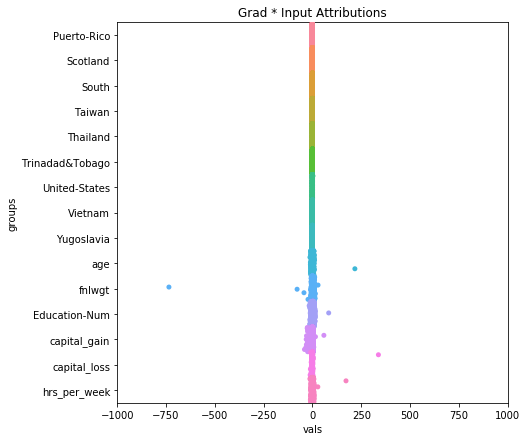

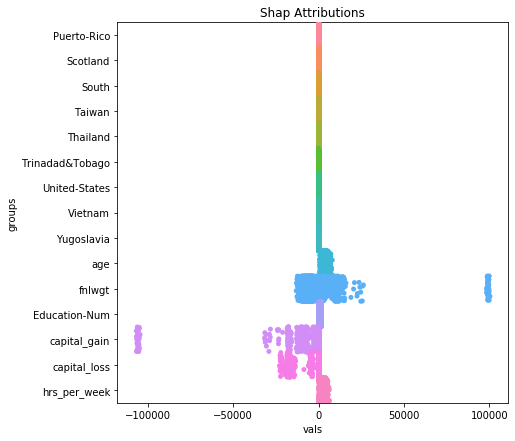

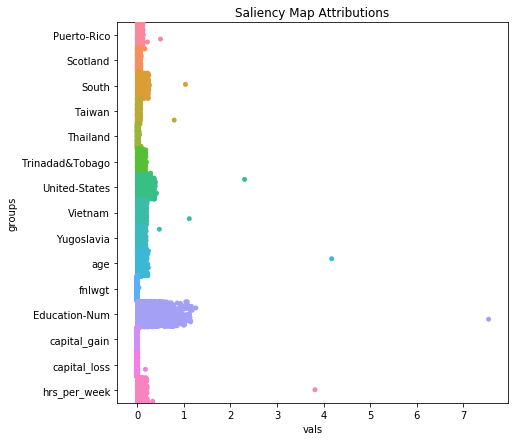

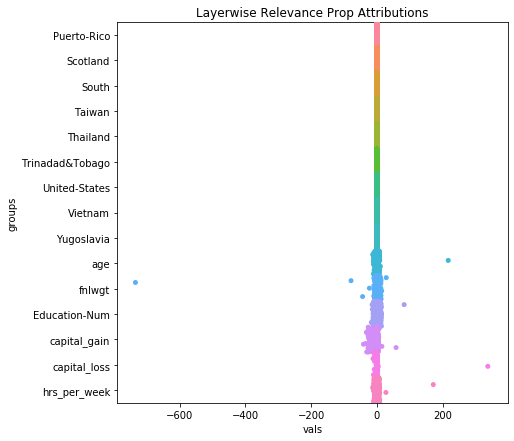

In [29]:
#Attributions computed over training set
attributions_gradin = load_obj('attributions_gradin')
attributions_sal = load_obj('attributions_sal')
attributions_elrp = load_obj('attributions_elrp')
attributions_sv = load_obj('attributions_sv')

deep_df = pd.DataFrame(attributions_gradin, columns=features)
deep_df = deep_df.iloc[:, -15:].melt(var_name='groups', value_name='vals')
ax = sns.stripplot(x="vals", y="groups", data=deep_df, jitter=.5)
plt.xlim(-1000, 1000)
plt.title('Grad * Input Attributions')
plt.show()

deep_df = pd.DataFrame(attributions_sv, columns=features)
deep_df = deep_df.iloc[:, -15:].melt(var_name='groups', value_name='vals')
ax = sns.stripplot(x="vals", y="groups", data=deep_df, jitter=.5)
plt.title('Shap Attributions')
plt.show()

deep_df = pd.DataFrame(attributions_sal, columns=features)
deep_df = deep_df.iloc[:, -15:].melt(var_name='groups', value_name='vals')
ax = sns.stripplot(x="vals", y="groups", data=deep_df, jitter=.5)
plt.title('Saliency Map Attributions')
plt.show()

deep_df = pd.DataFrame(attributions_elrp, columns=features)
deep_df = deep_df.iloc[:, -15:].melt(var_name='groups', value_name='vals')
ax = sns.stripplot(x="vals", y="groups", data=deep_df, jitter=.5)
plt.title('Layerwise Relevance Prop Attributions')
plt.show()

## GAM

In [ ]:
def shap_to_csv(model, file_name):
    local = pd.DataFrame(shap_values[str(type(model))],
                             columns=features) #Sampling 1st 500 observations for speed
    local.to_csv('obj/census/gam/{}_local.csv'.format(file_name))
    
shap_to_csv(gbc, 'gbc')
shap_to_csv(logit, 'logit')
shap_to_csv(keras_ann, 'keras_ann')
shap_to_csv(rfc, 'rfc')

'''
local shap values for all models are stored in the obj folder
change attributions_path based on which model you want to evaluate
    obj/rfc_local.csv
    obj/keras_ann_local.csv
    obj/gbc_local.csv
    obj/logit_local.csv

'''

from gam.gam.gam import GAM


gam = GAM(attributions_path="obj/census/gam/keras_ann_local.csv", k=2)


gam.generate()


Max Iterations:  1000


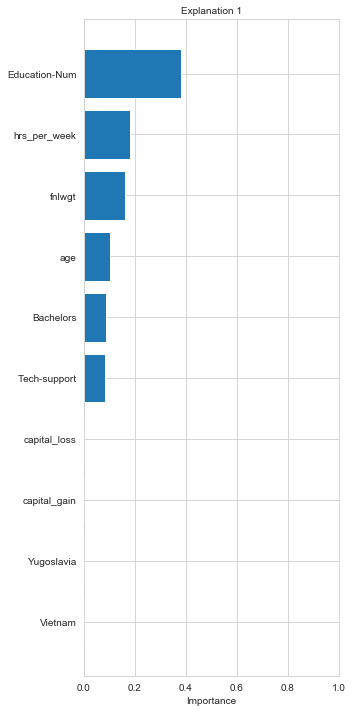

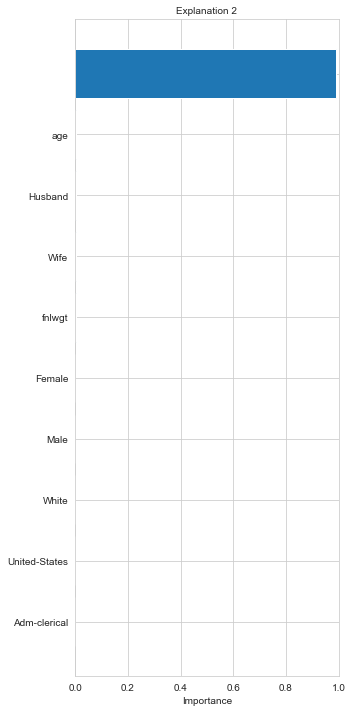

[('', 0.0), ('?', 0.0), ('Federal-gov', 0.0), ('Local-gov', 0.0), ('Never-worked', 0.0), ('Private', 0.0), ('Self-emp-inc', 0.0), ('Self-emp-not-inc', 0.0), ('State-gov', 0.0), ('Without-pay', 0.0), ('10th', 0.0), ('11th', 0.0), ('12th', 0.0), ('1st-4th', 0.0), ('5th-6th', 0.0), ('7th-8th', 0.0), ('9th', 0.0), ('Assoc-acdm', 0.0), ('Assoc-voc', 0.0), ('Bachelors', 0.08783001037963539), ('Doctorate', 0.0), ('HS-grad', 0.0), ('Masters', 0.0), ('Preschool', 0.0), ('Prof-school', 0.0), ('Some-college', 0.0), ('Divorced', 0.0), ('Married-AF-spouse', 0.0), ('Married-civ-spouse', 0.0), ('Married-spouse-absent', 0.0), ('Never-married', 0.0), ('Separated', 0.0), ('Widowed', 0.0), ('?', 0.0), ('Adm-clerical', 0.0), ('Armed-Forces', 0.0), ('Craft-repair', 0.0), ('Exec-managerial', 0.0), ('Farming-fishing', 0.0), ('Handlers-cleaners', 0.0), ('Machine-op-inspct', 0.0), ('Other-service', 0.0), ('Priv-house-serv', 0.0), ('Prof-specialty', 0.0), ('Protective-serv', 0.0), ('Sales', 0.0), ('Tech-support

In [22]:
gam.plot(num_features= 10)
print(gam.explanations[0])
#a = gam.explanations[0]
#sorted_by_second = sorted(a, key=lambda tup: tup[1], reverse=True)
#sorted_by_second